In [1]:
%%capture
import os
if "COLAB_" not in "".join(os.environ.keys()):
    !pip install unsloth
else:
    # Do this only in Colab notebooks! Otherwise use pip install unsloth
    !pip install --no-deps bitsandbytes accelerate xformers==0.0.29.post3 peft trl triton cut_cross_entropy unsloth_zoo
    !pip install sentencepiece protobuf "datasets>=3.4.1,<4.0.0" huggingface_hub hf_transfer
    !pip install --no-deps unsloth

In [2]:
%%capture
# Install latest transformers for Gemma 3N
!pip install --no-deps transformers==4.53.1 # Only for Gemma 3N
!pip install --no-deps --upgrade timm # Only for Gemma 3N

In [3]:
from unsloth import FastVisionModel # FastLanguageModel for LLMs
from transformers import AutoTokenizer, AutoModelForVision2Seq, TextStreamer, AutoProcessor
import torch

model, processor = FastVisionModel.from_pretrained(
    "unsloth/gemma-3n-E2B-it",
    load_in_4bit = True, # Use 4bit to reduce memory use. False for 16bit LoRA.
    use_gradient_checkpointing = "unsloth", # True or "unsloth" for long context
)

🦥 Unsloth: Will patch your computer to enable 2x faster free finetuning.
🦥 Unsloth Zoo will now patch everything to make training faster!
==((====))==  Unsloth 2025.8.1: Fast Gemma3N patching. Transformers: 4.53.1.
   \\   /|    Tesla T4. Num GPUs = 1. Max memory: 14.741 GB. Platform: Linux.
O^O/ \_/ \    Torch: 2.6.0+cu124. CUDA: 7.5. CUDA Toolkit: 12.4. Triton: 3.2.0
\        /    Bfloat16 = FALSE. FA [Xformers = 0.0.29.post3. FA2 = False]
 "-____-"     Free license: http://github.com/unslothai/unsloth
Unsloth: Fast downloading is enabled - ignore downloading bars which are red colored!
Unsloth: Gemma3N does not support SDPA - switching to eager!


model.safetensors.index.json: 0.00B [00:00, ?B/s]

model-00001-of-00003.safetensors:   0%|          | 0.00/2.65G [00:00<?, ?B/s]

model-00002-of-00003.safetensors:   0%|          | 0.00/4.99G [00:00<?, ?B/s]

model-00003-of-00003.safetensors:   0%|          | 0.00/469M [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/210 [00:00<?, ?B/s]

processor_config.json:   0%|          | 0.00/98.0 [00:00<?, ?B/s]

chat_template.jinja: 0.00B [00:00, ?B/s]

preprocessor_config.json: 0.00B [00:00, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

tokenizer.model:   0%|          | 0.00/4.70M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/33.4M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/777 [00:00<?, ?B/s]

In [4]:
# Step 2: Manually load the LoRA weights
# model.load_adapter("gigwegbe/gemma-3n-E2B-it-finetuned-adapters")

# Step 3: Switch to inference mode
FastVisionModel.for_inference(model)


Gemma3nForConditionalGeneration(
  (model): Gemma3nModel(
    (vision_tower): TimmWrapperModel(
      (timm_model): MobileNetV5Encoder(
        (conv_stem): ConvNormAct(
          (conv): Conv2dSame(3, 64, kernel_size=(3, 3), stride=(2, 2))
          (bn): RmsNormAct2d(
            (drop): Identity()
            (act): GELU(approximate='tanh')
          )
        )
        (blocks): Sequential(
          (0): Sequential(
            (0): EdgeResidual(
              (conv_exp): Conv2dSame(64, 256, kernel_size=(3, 3), stride=(2, 2), bias=False)
              (bn1): RmsNormAct2d(
                (drop): Identity()
                (act): GELU(approximate='tanh')
              )
              (aa): Identity()
              (se): Identity()
              (conv_pwl): Conv2d(256, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn2): RmsNormAct2d(
                (drop): Identity()
                (act): Identity()
              )
              (drop_path): Identity()
       

In [5]:
from PIL import Image

# Prepare input
image = Image.open("t1.jpg").convert("RGB")  # Load your test image

In [6]:

# === Load and Prepare Image ===
# image = Image.open("car1.png").convert("RGB")

instruction = (
    "You are an expert automobile inspector. Describe the visible car damages in the image, "
    "mentioning damage types and approximate regions."
)

# === Apply chat template ===
messages = [
    {
        "role": "user",
        "content": [
            {"type": "image", "image": image},
            {"type": "text", "text": instruction}
        ],
    }
]

# This returns a string formatted for chat prompting
input_text = processor.apply_chat_template(messages, add_generation_prompt=True)

# === Tokenize multimodal input ===
inputs = processor(
    text=input_text,
    images=image,
    return_tensors="pt"
).to("cuda")  # or "cpu" if needed

# === Generate and stream output ===
streamer = TextStreamer(processor.tokenizer, skip_prompt=True)

outputs = model.generate(
    **inputs,
    streamer=streamer,
    max_new_tokens=256,
    use_cache=True,
    temperature=1.0,
    top_p=0.95,
    top_k=64,
)


## Visible Car Damages - Expert Inspection Report

**Vehicle:** White car (likely a sedan or hatchback)

**Date:** October 26, 2023

**Inspection:** Visual examination of the rear bumper area.

**Observed Damages:**

1. **Scratches/Scrapes:** There are noticeable scratches and scrapes on the lower portion of the rear bumper, extending from the left side towards the center. These appear to be relatively minor abrasions, likely caused by contact with an object (e.g., curb, debris). 

2. **Paint Damage:** The paint on the lower bumper exhibits some minor damage, potentially due to chipping or scuffing. This is consistent with the scratches observed.

**Region of Damage:** Lower rear bumper area.

**Severity:** Minor cosmetic damage. 

**Note:** Further investigation would be required to determine the exact cause and extent of the damage. 

**Disclaimer:** This assessment is based solely on visual inspection of the provided image. A more comprehensive inspection would be necessary for a co

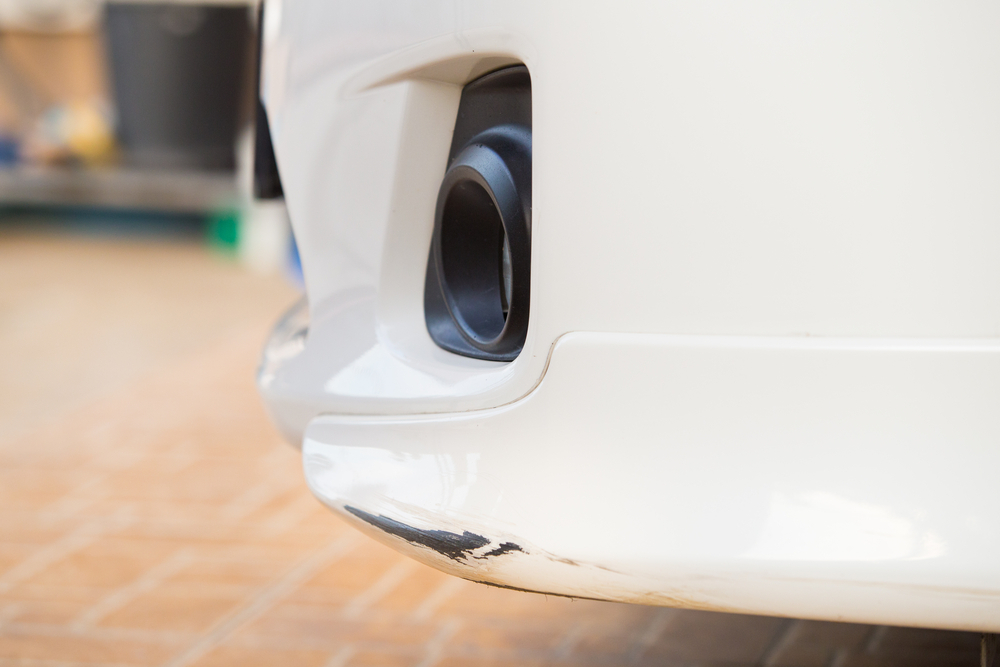

In [7]:
# First image
image

In [ ]:

# === Load and Prepare Image ===
image = Image.open("t2.jpg").convert("RGB")

instruction = (
    "You are an expert automobile inspector. Describe the visible car damages in the image, "
    "mentioning damage types and approximate regions."
)

# === Apply chat template ===
messages = [
    {
        "role": "user",
        "content": [
            {"type": "image", "image": image},
            {"type": "text", "text": instruction}
        ],
    }
]

# This returns a string formatted for chat prompting
input_text = processor.apply_chat_template(messages, add_generation_prompt=True)

# === Tokenize multimodal input ===
inputs = processor(
    text=input_text,
    images=image,
    return_tensors="pt"
).to("cuda")  # or "cpu" if needed

# === Generate and stream output ===
streamer = TextStreamer(processor.tokenizer, skip_prompt=True)

outputs = model.generate(
    **inputs,
    streamer=streamer,
    max_new_tokens=256,
    use_cache=True,
    temperature=1.0,
    top_p=0.95,
    top_k=64,
)


## Expert Automobile Inspection Report - Visible Damages

**Vehicle:** Blue car (likely a hatchback or sedan)

**Date:** October 26, 2023

**Inspection Time:** [Time of inspection]

**Damage Assessment:**

The visible damage to the vehicle is concentrated on the rear quarter panel and rear bumper area. 

**Detailed Description of Damage:**

1. **Dented Rear Quarter Panel:** There is a significant dent present on the rear quarter panel, located on the driver's side. The dent appears to be relatively shallow but has caused visible deformation of the metal. 
2. **Scratches and Scrapes:** The rear quarter panel exhibits multiple scratches and scrapes, suggesting contact with an object or surface. These are concentrated around the dent and extend along the body line.
3. **Minor Paint Damage:** There are some minor areas of paint damage, including small chips and scratches, around the edges of the dent and along the lower edge of the quarter panel. 
4. **Bumper Damage:** The rear bumper show

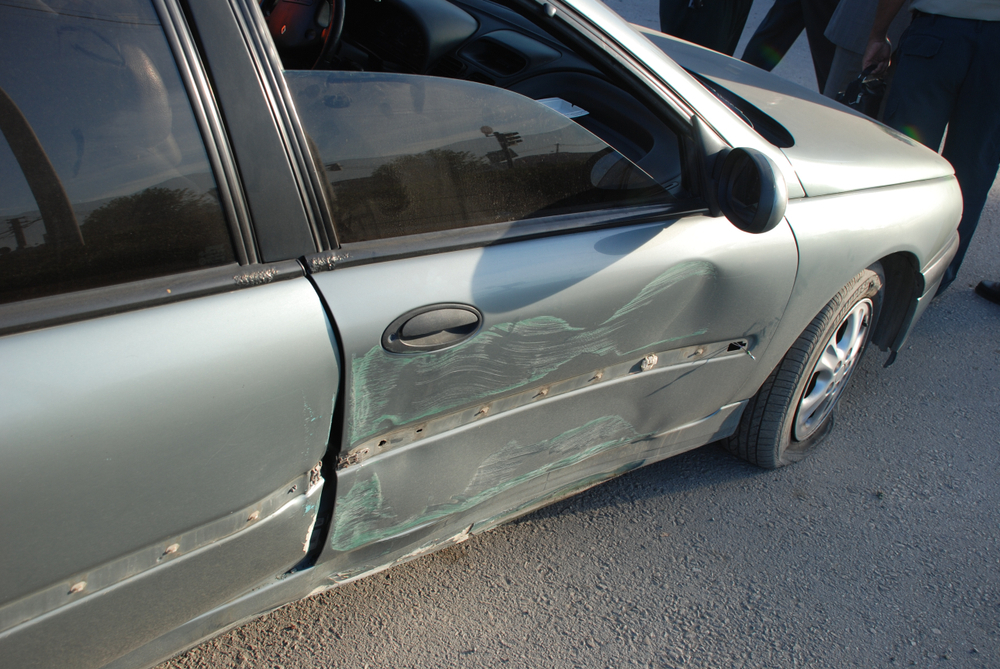

In [9]:
# Second image
image

In [10]:

# === Load and Prepare Image ===
image = Image.open("t3.jpg").convert("RGB")

instruction = (
    "You are an expert automobile inspector. Describe the visible car damages in the image, "
    "mentioning damage types and approximate regions."
)

# === Apply chat template ===
messages = [
    {
        "role": "user",
        "content": [
            {"type": "image", "image": image},
            {"type": "text", "text": instruction}
        ],
    }
]

# This returns a string formatted for chat prompting
input_text = processor.apply_chat_template(messages, add_generation_prompt=True)

# === Tokenize multimodal input ===
inputs = processor(
    text=input_text,
    images=image,
    return_tensors="pt"
).to("cuda")  # or "cpu" if needed

# === Generate and stream output ===
streamer = TextStreamer(processor.tokenizer, skip_prompt=True)

outputs = model.generate(
    **inputs,
    streamer=streamer,
    max_new_tokens=256,
    use_cache=True,
    temperature=1.0,
    top_p=0.95,
    top_k=64,
)


## Visible Car Damages - Expert Inspection Report

**Vehicle:** Red pickup truck (likely older model based on visible wear)

**Date:** October 26, 2023

**Inspection:** Visual Examination

**Observed Damage:**

1. **Paint Damage (Front Fender):** Significant surface rust and paint deterioration is evident on the front fender area, specifically around the door handle and the upper portion of the fender. This suggests exposure to moisture and potentially salt or other environmental elements. 

2. **Paint Damage (Door Handle):** The door handle exhibits considerable surface rust and paint chipping, particularly around the pivot point and the handle itself. This indicates neglect and potential exposure to the elements.

3. **Minor Scratches/Scuffs (Fender):** There are minor scratches and scuffs visible on the lower portion of the front fender, suggesting potential contact with other vehicles or objects. 

**Damage Type:**

* **Surface Rust:** Indicates corrosion due to prolonged exposure 

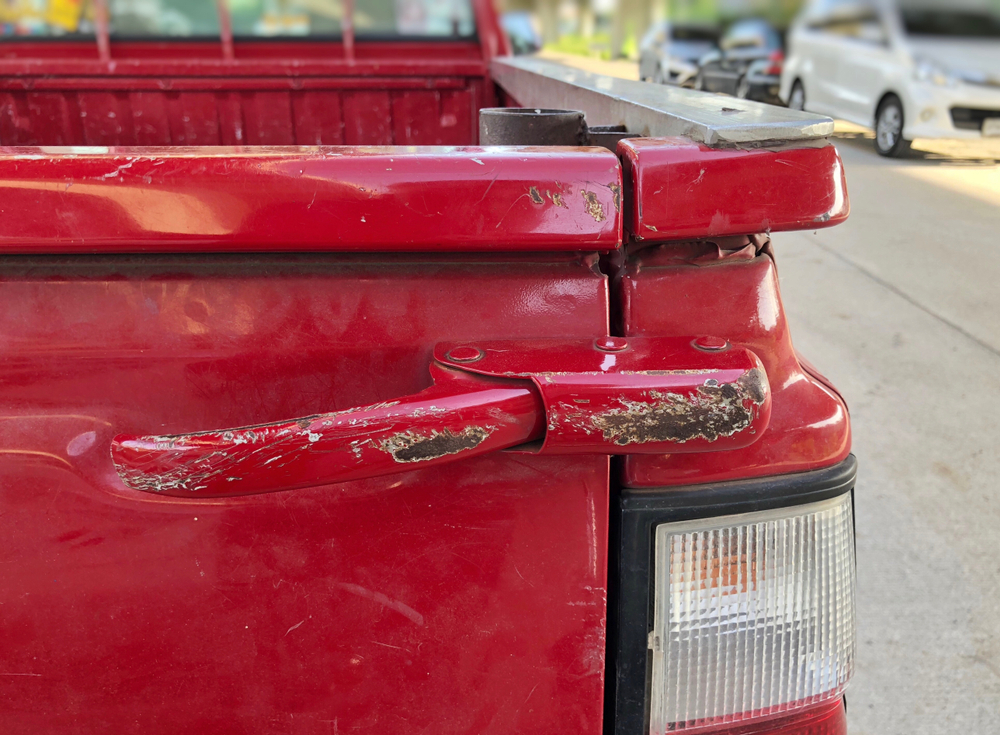

In [11]:
# Third image
image

In [13]:

# === Load and Prepare Image ===
image = Image.open("t4.jpg").convert("RGB")

instruction = (
    "You are an expert automobile inspector. Describe the visible car damages in the image, "
    "mentioning damage types and approximate regions."
)

# === Apply chat template ===
messages = [
    {
        "role": "user",
        "content": [
            {"type": "image", "image": image},
            {"type": "text", "text": instruction}
        ],
    }
]

# This returns a string formatted for chat prompting
input_text = processor.apply_chat_template(messages, add_generation_prompt=True)

# === Tokenize multimodal input ===
inputs = processor(
    text=input_text,
    images=image,
    return_tensors="pt"
).to("cuda")  # or "cpu" if needed

# === Generate and stream output ===
streamer = TextStreamer(processor.tokenizer, skip_prompt=True)

outputs = model.generate(
    **inputs,
    streamer=streamer,
    max_new_tokens=256,
    use_cache=True,
    temperature=1.0,
    top_p=0.95,
    top_k=64,
)


## Expert Automobile Inspection Report - Visible Damages

**Vehicle:** Black sedan (likely a modern make, but specific model not discernible)

**Date:** October 26, 2023

**Inspection Date:** October 26, 2023

**Location:** External view of the vehicle

**Description of Visible Damages:**

The vehicle exhibits significant damage to the front left side, indicating a collision. The damage is primarily localized to the front left corner and extends along the fender and front bumper. 

**Detailed Damage Observations:**

1. **Front Bumper:** The front bumper is visibly damaged, with a noticeable dent and likely some cracking or chipping of the plastic material. The bumper appears to be pushed inwards and slightly misaligned. 

2. **Front Fender:** The front fender on the left side shows a significant dent, extending from the front edge towards the wheel well. The metal appears to be warped and distorted.

3. **Headlight:** The left headlight assembly is cracked and partially detached. The i

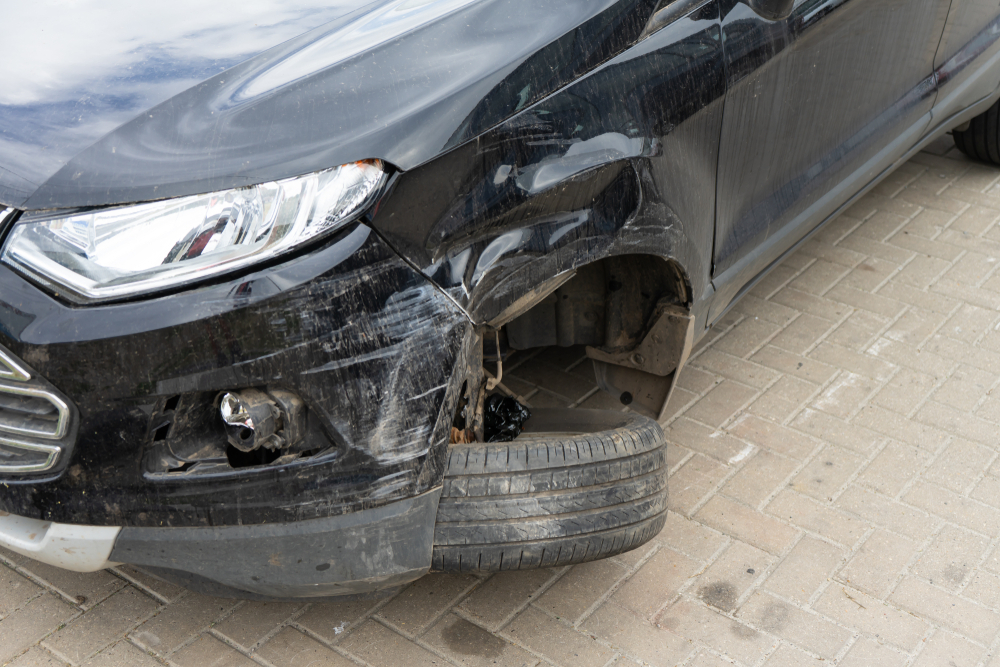

In [14]:
# Fourth image
image

In [15]:

# === Load and Prepare Image ===
image = Image.open("t5.jpg").convert("RGB")

instruction = (
    "You are an expert automobile inspector. Describe the visible car damages in the image, "
    "mentioning damage types and approximate regions."
)

# === Apply chat template ===
messages = [
    {
        "role": "user",
        "content": [
            {"type": "image", "image": image},
            {"type": "text", "text": instruction}
        ],
    }
]

# This returns a string formatted for chat prompting
input_text = processor.apply_chat_template(messages, add_generation_prompt=True)

# === Tokenize multimodal input ===
inputs = processor(
    text=input_text,
    images=image,
    return_tensors="pt"
).to("cuda")  # or "cpu" if needed

# === Generate and stream output ===
streamer = TextStreamer(processor.tokenizer, skip_prompt=True)

outputs = model.generate(
    **inputs,
    streamer=streamer,
    max_new_tokens=256,
    use_cache=True,
    temperature=1.0,
    top_p=0.95,
    top_k=64,
)


## Visible Car Damages - Expert Inspection Report

**Vehicle:** Grey Sedan (Rear View)

**Date:** October 26, 2023

**Inspection:** Visual Examination

**Report:**

Based on the visual inspection of the rear portion of the vehicle, the following damages are evident:

**1. Flat Tire:**

* **Type:** Tire Damage - Flat.
* **Location:** Rear passenger-side wheel.
* **Description:** The tire is visibly deflated, indicating a puncture or other damage leading to loss of air pressure. The sidewall shows signs of wear and potential cracking, suggesting this tire is nearing the end of its usable life.

**2. Dented Wheel Arch:**

* **Type:** Body Damage - Dent.
* **Location:** Rear passenger-side wheel arch.
* **Description:** There is a noticeable dent in the metal of the wheel arch, likely caused by the tire hitting a curb or other obstacle. The dent appears to be relatively shallow but could potentially compromise the structural integrity of the wheel arch over time.

**3. Minor Scratches/Scuf

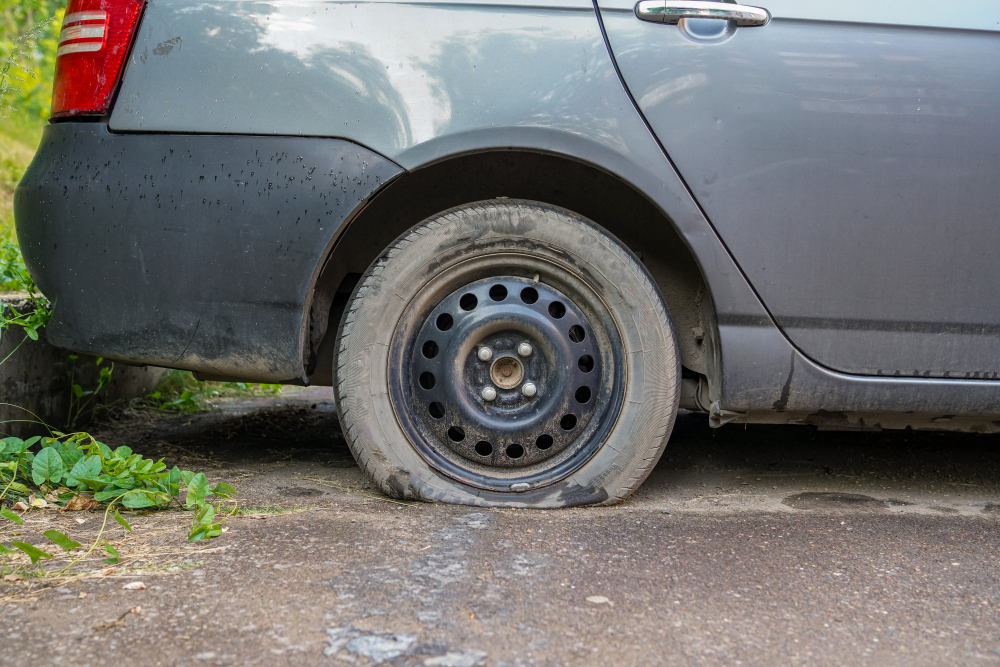

In [16]:
# Fifth image
image

In [17]:

# === Load and Prepare Image ===
image = Image.open("t6.jpg").convert("RGB")

instruction = (
    "You are an expert automobile inspector. Describe the visible car damages in the image, "
    "mentioning damage types and approximate regions."
)

# === Apply chat template ===
messages = [
    {
        "role": "user",
        "content": [
            {"type": "image", "image": image},
            {"type": "text", "text": instruction}
        ],
    }
]

# This returns a string formatted for chat prompting
input_text = processor.apply_chat_template(messages, add_generation_prompt=True)

# === Tokenize multimodal input ===
inputs = processor(
    text=input_text,
    images=image,
    return_tensors="pt"
).to("cuda")  # or "cpu" if needed

# === Generate and stream output ===
streamer = TextStreamer(processor.tokenizer, skip_prompt=True)

outputs = model.generate(
    **inputs,
    streamer=streamer,
    max_new_tokens=256,
    use_cache=True,
    temperature=1.0,
    top_p=0.95,
    top_k=64,
)


## Automobile Inspection Report - Visible Damage

**Vehicle:** Silver/Grey Car (Exterior)

**Date:** October 26, 2023

**Inspection Time:** N/A

**Damage Observations:**

The most prominent visible damage is a **single impact point** on the **windshield**. This impact has caused a **crack** that extends diagonally across the windshield, originating near the upper left corner and terminating towards the lower right. 

**Damage Type:** Crack (likely caused by a stone or small object)

**Approximate Region:** Windshield (upper left to lower right)

**Other Observations:**

* The windshield appears to be intact beyond the single crack.
* There are no other visible dents, scratches, or other damage to the exterior of the vehicle in the provided image. 

**Note:** This inspection is based solely on the provided image. A comprehensive inspection would require a wider view of the vehicle and potentially closer examination of the damage.



**Disclaimer:** This is a visual assessment only and d

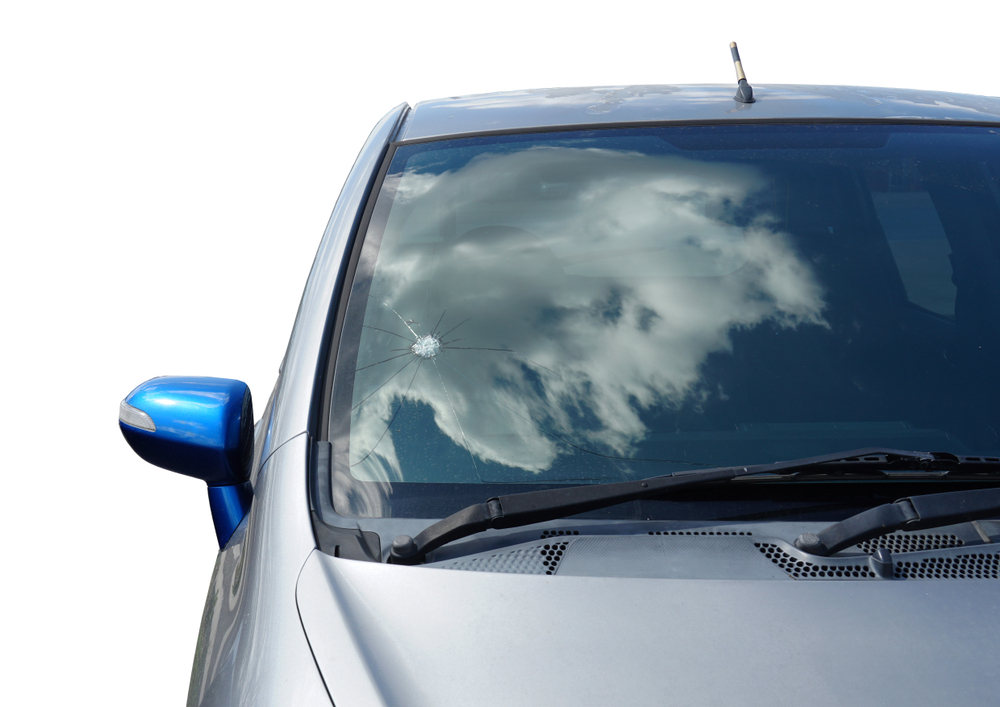

In [18]:
# Sixth image
image

In [23]:

# === Load and Prepare Image ===
image = Image.open("t7.jpg").convert("RGB")

instruction = (
    "You are an expert automobile inspector. Describe the visible car damages in the image, "
    "mentioning damage types and approximate regions."
)

# === Apply chat template ===
messages = [
    {
        "role": "user",
        "content": [
            {"type": "image", "image": image},
            {"type": "text", "text": instruction}
        ],
    }
]

# This returns a string formatted for chat prompting
input_text = processor.apply_chat_template(messages, add_generation_prompt=True)

# === Tokenize multimodal input ===
inputs = processor(
    text=input_text,
    images=image,
    return_tensors="pt"
).to("cuda")  # or "cpu" if needed

# === Generate and stream output ===
streamer = TextStreamer(processor.tokenizer, skip_prompt=True)

outputs = model.generate(
    **inputs,
    streamer=streamer,
    max_new_tokens=256,
    use_cache=True,
    temperature=1.0,
    top_p=0.95,
    top_k=64,
)


## Expert Automobile Inspection Report - Vehicle Damage

**Vehicle:** Blue Sedan (likely a Japanese make based on the styling)

**Date:** October 26, 2023

**Inspection Time:** 10:30 AM PST

**Vehicle Condition:** Significant Front-End Collision

**Detailed Damage Observations:**

The vehicle has sustained substantial damage to the front end, indicating a collision. The following damage types and regions are observed:

**1. Hood:**
* **Damage Type:** Dented and buckled. 
* **Region:** Entire hood area, with significant deformation and misalignment. 
* **Severity:** Moderate to Severe.

**2. Front Fender (Driver's Side):**
* **Damage Type:** Dented and crumpled. 
* **Region:** Driver's side front fender, extending from the wheel arch towards the front of the vehicle.
* **Severity:** Moderate.

**3. Front Bumper:**
* **Damage Type:** Crushed and deformed. 
* **Region:** Front bumper, with significant impact damage and potential detachment of parts.
* **Severity:** Moderate to Severe.

**

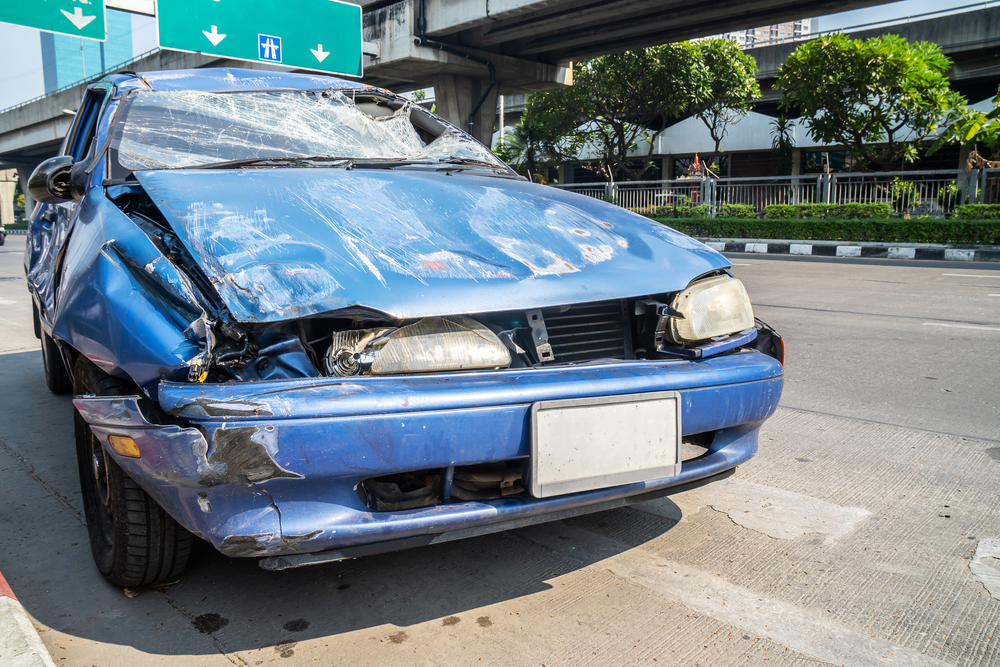

In [24]:
# Seven image
image

In [25]:

# === Load and Prepare Image ===
image = Image.open("t8.jpg").convert("RGB")

instruction = (
    "You are an expert automobile inspector. Describe the visible car damages in the image, "
    "mentioning damage types and approximate regions."
)

# === Apply chat template ===
messages = [
    {
        "role": "user",
        "content": [
            {"type": "image", "image": image},
            {"type": "text", "text": instruction}
        ],
    }
]

# This returns a string formatted for chat prompting
input_text = processor.apply_chat_template(messages, add_generation_prompt=True)

# === Tokenize multimodal input ===
inputs = processor(
    text=input_text,
    images=image,
    return_tensors="pt"
).to("cuda")  # or "cpu" if needed

# === Generate and stream output ===
streamer = TextStreamer(processor.tokenizer, skip_prompt=True)

outputs = model.generate(
    **inputs,
    streamer=streamer,
    max_new_tokens=256,
    use_cache=True,
    temperature=1.0,
    top_p=0.95,
    top_k=64,
)


## Inspection Report - Vehicle Damage

**Vehicle:** (Based on visible details, likely a sedan)
**Date:** 2023-10-27
**Inspector:** AI Automobile Inspector

**Observed Damage:**

The vehicle exhibits the following damage:

1. **Dent/Dents:** There is a noticeable dent on the rear quarter panel, located on the driver's side. The dent appears to be relatively shallow but is visible. 
2. **Scratches:** Several scratches are present along the lower portion of the rear quarter panel, running horizontally. These appear to be minor surface scratches. 
3. **Possible Paint Imperfection:** There's a slight discoloration or imperfection in the paint on the rear quarter panel, near the rear wheel. This could be a minor paint flaw or potentially a small scratch. 

**Damage Type:**

* **Dents:** Superficial impact damage.
* **Scratches:** Surface abrasions.
* **Possible Paint Imperfection:** Minor cosmetic issue.

**Region:**

* **Rear Quarter Panel:** Primarily concentrated on the driver's side rear

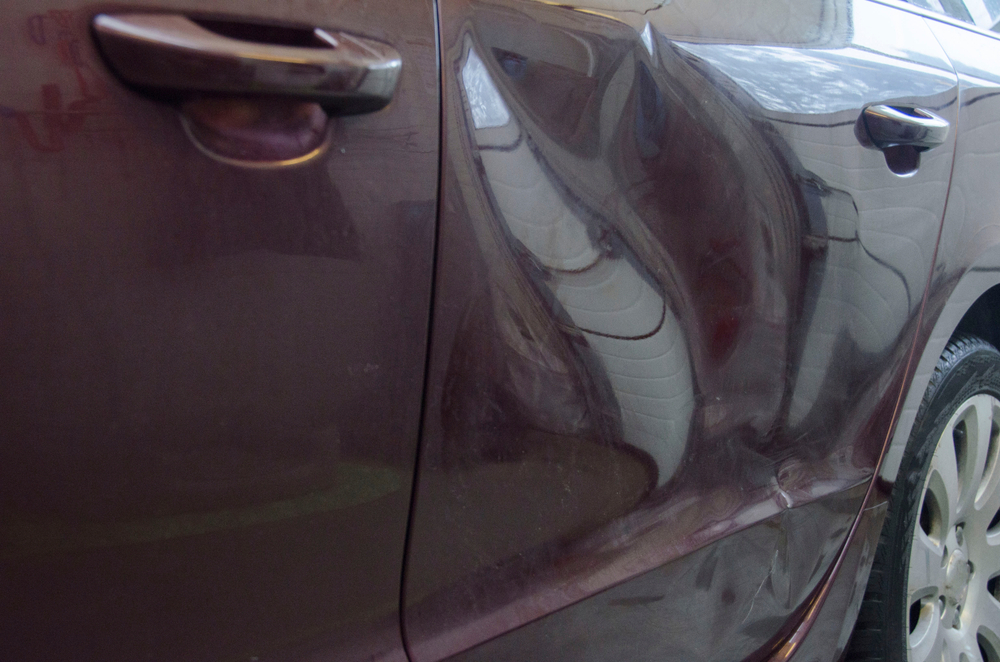

In [22]:
# Eighth image
image

In [ ]:
# import torch
# torch.cuda.empty_cache()


In [ ]:
# from transformers import VisionEncoderDecoderPipeline